<a href="https://colab.research.google.com/github/Justinezgh/SBI-Diff-Simulator/blob/add-lv-script/notebooks/get_ref_posterior_lv_with_latent_variables.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install matplotlib==3.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.3 MB 10.1 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [1]:
!pip install --quiet git+https://github.com/Justinezgh/SBI-Diff-Simulator.git

     |████████████████████████████████| 119 kB 6.8 MB/s 
     |████████████████████████████████| 283 kB 8.2 MB/s 


In [2]:
!pip install chainconsumer

In [ ]:
#!sudo apt-get install texlive-latex-extra texlive-fonts-recommended dvipng cm-super

In [3]:
%pylab inline

#import sbibm
from sbids.tasks import lotka_volterra 
from sbids.tasks.utils import get_samples_and_scores

import jax
from jax.experimental.ode import odeint
import jax.numpy as jnp
from jax.random import PRNGKey


from numpyro.handlers import seed, trace, condition

Populating the interactive namespace from numpy and matplotlib


In [4]:
from numpyro.infer import MCMC, NUTS, Predictive, initialization
from chainconsumer import ChainConsumer

In [5]:
import jax.numpy as jnp
from jax.experimental.ode import odeint
from tensorflow_probability.substrates import jax as tfp
tfd = tfp.distributions
tfb = tfp.bijectors

import numpyro
import numpyro.distributions as dist

__all__=["lotka_volterra", "lotka_volterra_y_bijector", "lotka_volterra_theta_bijector"]

def _dz_dt(z, t, theta):
    """
    Lotka–Volterra equations. Real positive parameters `alpha`, `beta`, `gamma`, `delta`
    describes the interaction of two species.
    """
    u = z[0]
    v = z[1]
    
    alpha, beta, gamma, delta = (
        theta[..., 0],
        theta[..., 1],
        theta[..., 2],
        theta[..., 3],
    )
    du_dt = (alpha - beta * v) * u
    dv_dt = (-gamma + delta * u) * v
    return jnp.stack([du_dt, dv_dt])


def lotka_volterra2(y=None, ts=jnp.linspace(0,18.9,10)):
    """
    Probabilistic model for the Lotka–Volterra system.
    :param int N: number of measurement times
    :param numpy.ndarray y: measured populations with shape (N, 2)
    """
    # initial population
    z = numpyro.sample("z", dist.LogNormal(jnp.log(3), 0.5).expand([2]))
    
    # parameters alpha, beta, gamma, delta of dz_dt
    theta = numpyro.sample(
        "theta",
        dist.LogNormal(
            loc=jnp.array([-0.125,-3,-0.125,-3]),
            scale=jnp.array([0.03, 0.03, 0.03, 0.03]),
        ),
    )
    
    # integrate dz/dt, the result will have shape N x 2
    x = odeint(_dz_dt, z, ts, theta, rtol=1e-6, atol=1e-5, mxstep=1000)
    x = jnp.clip(x, 1e-10, 1e4) # clip to avoid nan

    # measured populations
    return numpyro.sample("y", dist.LogNormal(jnp.log(x), jnp.ones_like(x)*0.1), obs=y)



In [6]:
model1 = condition(lotka_volterra, {'z': jnp.array([10.,1.])})
model2 = lotka_volterra
model3 = lotka_volterra2
model4 = condition(lotka_volterra2, {'z': jnp.array([10.,1.])})

prior1 = prior = tfd.LogNormal([-0.125,-3,-0.125,-3],[0.5,0.5,0.5,0.5]).sample(1000,seed=jax.random.PRNGKey(3))
prior2 = prior = tfd.LogNormal([-0.125,-3,-0.125,-3],[0.5,0.5,0.5,0.5]).sample(1000,seed=jax.random.PRNGKey(3))
prior3 = tfd.LogNormal([-0.125,-3,-0.125,-3],[0.03,0.03,0.03,0.03]).sample(1000,seed=jax.random.PRNGKey(3))
prior4 = tfd.LogNormal([-0.125,-3,-0.125,-3],[0.03,0.03,0.03,0.03]).sample(1000,seed=jax.random.PRNGKey(3))

@jax.jit
def get_batch1(key, batch_size=1):
    model = model1
    (log_probs, samples), scores = get_samples_and_scores(model, key, batch_size=batch_size)
    return samples['theta'], samples['y']

@jax.jit
def get_batch2(key, batch_size=1):
    model = model2
    (log_probs, samples), scores = get_samples_and_scores(model, key, batch_size=batch_size)
    return samples['theta'], samples['y']

@jax.jit
def get_batch3(key, batch_size=1):
    model = model3
    (log_probs, samples), scores = get_samples_and_scores(model, key, batch_size=batch_size)
    return samples['theta'], samples['y']

@jax.jit
def get_batch4(key, batch_size=1):
    model = model4
    (log_probs, samples), scores = get_samples_and_scores(model, key, batch_size=batch_size)
    return samples['theta'], samples['y']

sample: 100%|██████████| 11000/11000 [00:23<00:00, 460.29it/s, 7 steps of size 4.17e-01. acc. prob=0.91] 



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.61      0.01      0.61      0.60      0.63   6604.73      1.00
  theta[1]      0.03      0.00      0.03      0.03      0.03   7267.89      1.00
  theta[2]      1.61      0.02      1.61      1.57      1.65   6907.40      1.00
  theta[3]      0.02      0.00      0.02      0.02      0.02   6630.26      1.00

Number of divergences: 0
[[0.603503   0.03026864 1.6093055  0.01722082]]


sample: 100%|██████████| 11000/11000 [00:19<00:00, 568.33it/s, 7 steps of size 6.48e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.84      0.02      0.84      0.81      0.87   9172.26      1.00
  theta[1]      0.05      0.00      0.05      0.04      0.05   8847.07      1.00
  theta[2]      0.63      0.01      0.63      0.61      0.64   9598.51      1.00
  theta[3]      0.06      0.00      0.06      0.05      0.06   8706.73      1.00

Number of divergences: 0
[[0.8645958  0.0514284  0.6212191  0.05462185]]


sample: 100%|██████████| 11000/11000 [00:26<00:00, 413.45it/s, 7 steps of size 3.06e-01. acc. prob=0.93] 



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.42      0.01      1.42      1.40      1.44   6517.20      1.00
  theta[1]      0.02      0.00      0.02      0.02      0.02   5702.14      1.00
  theta[2]      0.51      0.00      0.51      0.51      0.52   5875.33      1.00
  theta[3]      0.16      0.00      0.16      0.15      0.17   5651.91      1.00

Number of divergences: 0
[[1.4310894  0.02207088 0.5101378  0.15524037]]


sample: 100%|██████████| 11000/11000 [00:19<00:00, 573.94it/s, 3 steps of size 9.04e-01. acc. prob=0.84]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.52      0.02      0.52      0.49      0.55  12383.60      1.00
  theta[1]      0.11      0.01      0.11      0.10      0.12  11875.13      1.00
  theta[2]      1.02      0.04      1.02      0.96      1.09  12259.11      1.00
  theta[3]      0.05      0.00      0.05      0.04      0.05  12353.90      1.00

Number of divergences: 0
[[0.5340783  0.11614588 1.0002466  0.04279097]]


sample: 100%|██████████| 11000/11000 [00:20<00:00, 539.63it/s, 7 steps of size 5.51e-01. acc. prob=0.92]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.01      0.02      1.01      0.98      1.05   9526.34      1.00
  theta[1]      0.07      0.00      0.07      0.06      0.08   9606.08      1.00
  theta[2]      1.00      0.02      1.00      0.97      1.04   9913.33      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.06   9078.47      1.00

Number of divergences: 0
[[0.9956166  0.07275394 0.98788786 0.05611869]]


<Figure size 1000x1000 with 0 Axes>

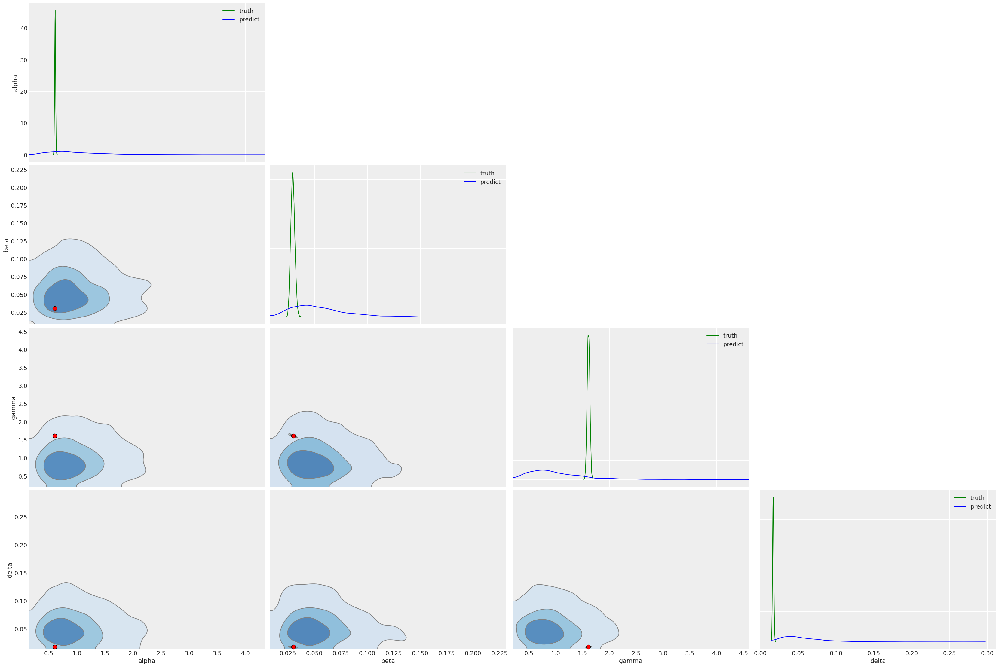

<Figure size 1000x1000 with 0 Axes>

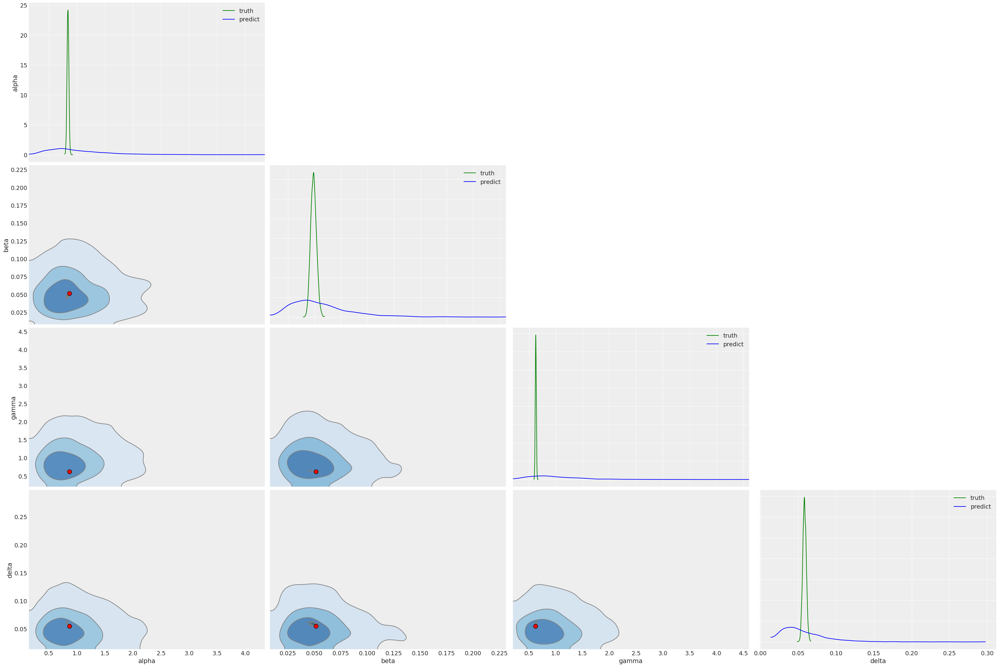

<Figure size 1000x1000 with 0 Axes>

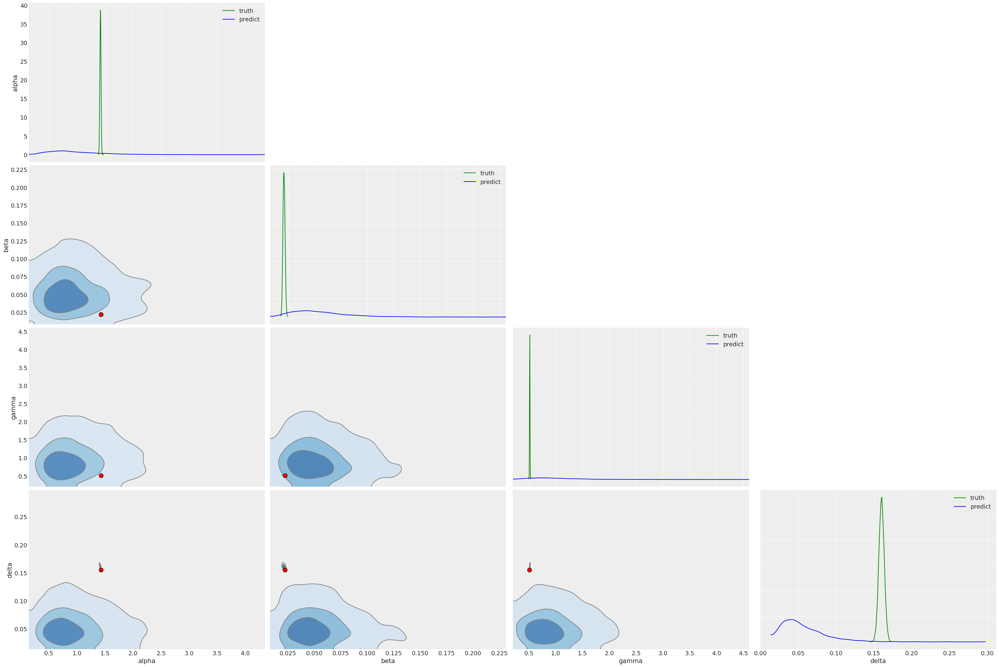

<Figure size 1000x1000 with 0 Axes>

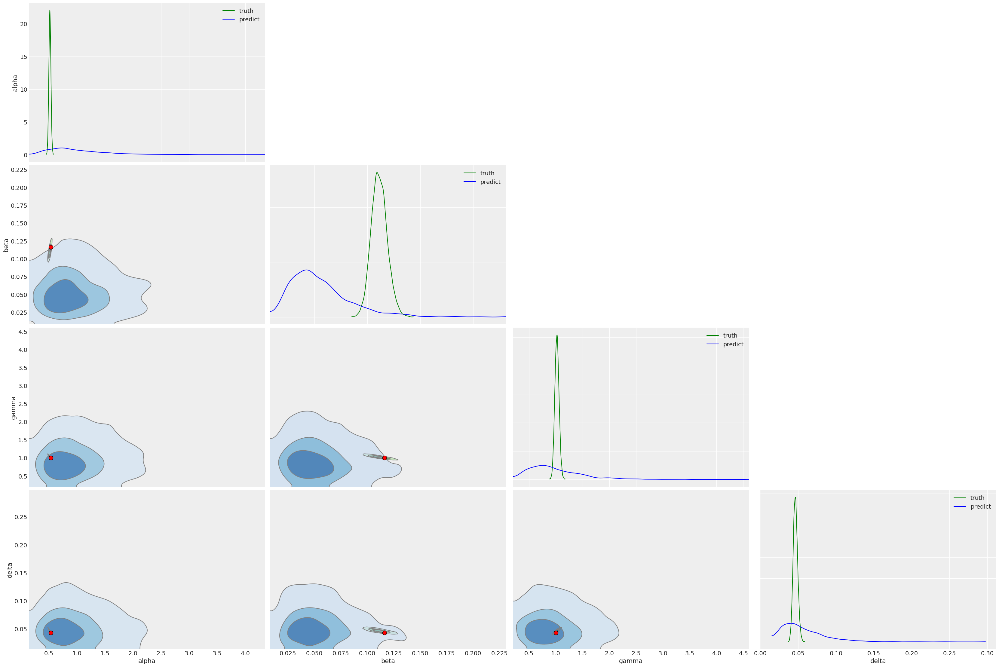

<Figure size 1000x1000 with 0 Axes>

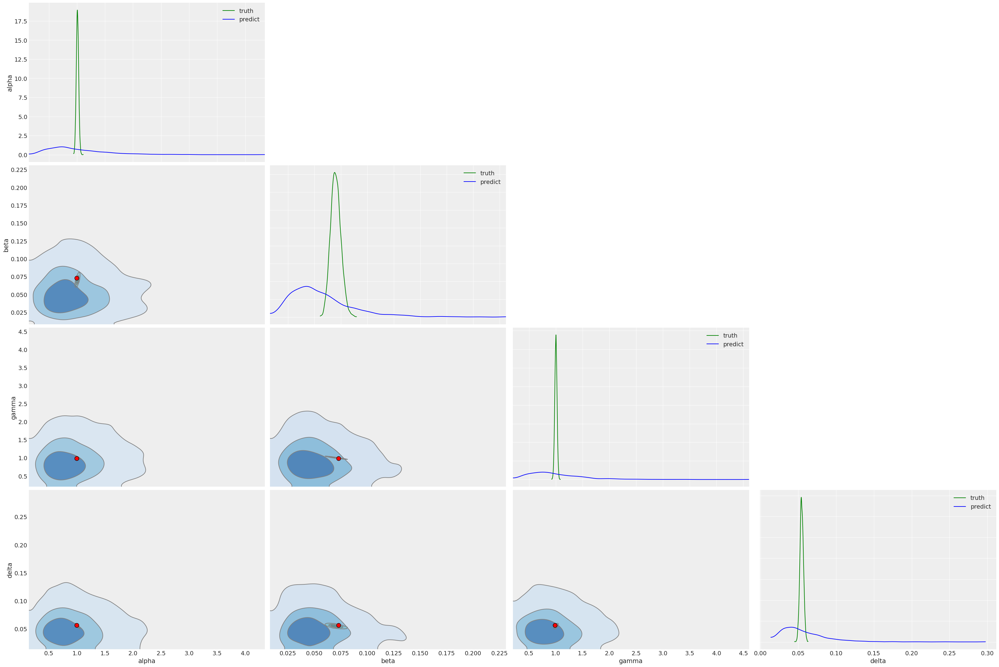

In [7]:
# without latent variables and wide prior 
for i in range(5):

  truth, observation = get_batch1(jax.random.PRNGKey(i))

  mcmc = MCMC(
      NUTS(model1, dense_mass=True,
          init_strategy=initialization.init_to_sample),
      num_warmup=1000,
      num_samples=10000,
      num_chains=1,
      progress_bar=True,
  )
  mcmc.run(PRNGKey(188), y=observation.squeeze()) 
  mcmc.print_summary()
  print(truth)

  test_samples = mcmc.get_samples()
  jnp.save('reference_sample_without_latent_variables_seed%d' % i, test_samples['theta'])

  import arviz as az
  az.style.use("arviz-darkgrid")

  parameters = ["alpha", "beta", "gamma", "delta"]

  reference_samples = test_samples['theta']

  plt.figure(figsize=(10, 10))
  ax = az.plot_pair(
        data={
          k: reference_samples[:,i]
          for i,k in enumerate(parameters)
        },
        kind="kde",
        var_names=parameters,
        kde_kwargs={
            "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
            "contourf_kwargs": {"cmap": "Greens"},
        },
        marginals=True,
        marginal_kwargs={'color': 'g', 'label': 'truth'},
        reference_values=dict(zip(parameters, np.array(truth.squeeze()))),
        reference_values_kwargs={'markersize': 10, 'color': 'red', 'label': 'truth'}

    )
  
  az.plot_pair(
      data={
        k: prior1[:,i] 
        for i,k in enumerate(parameters)
      },
      kind="kde",
      var_names=parameters,
      kde_kwargs={
          "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
          "contourf_kwargs": {"cmap": "Blues", "alpha": 0.7},
      },
      marginals=True,
      marginal_kwargs={'color': 'b', 'label': 'predict'}, 
      ax=ax
  )


sample: 100%|██████████| 11000/11000 [00:24<00:00, 442.19it/s, 7 steps of size 4.17e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.61      0.01      0.61      0.60      0.63   6604.73      1.00
  theta[1]      0.03      0.00      0.03      0.03      0.03   7267.89      1.00
  theta[2]      1.61      0.02      1.61      1.57      1.65   6907.40      1.00
  theta[3]      0.02      0.00      0.02      0.02      0.02   6630.26      1.00

Number of divergences: 0
[[0.603503   0.03026864 1.6093055  0.01722082]]


sample: 100%|██████████| 11000/11000 [00:19<00:00, 568.81it/s, 7 steps of size 6.48e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.84      0.02      0.84      0.81      0.87   9172.26      1.00
  theta[1]      0.05      0.00      0.05      0.04      0.05   8847.07      1.00
  theta[2]      0.63      0.01      0.63      0.61      0.64   9598.51      1.00
  theta[3]      0.06      0.00      0.06      0.05      0.06   8706.73      1.00

Number of divergences: 0
[[0.8645958  0.0514284  0.6212191  0.05462185]]


sample: 100%|██████████| 11000/11000 [00:27<00:00, 404.98it/s, 7 steps of size 3.06e-01. acc. prob=0.93] 



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.42      0.01      1.42      1.40      1.44   6517.20      1.00
  theta[1]      0.02      0.00      0.02      0.02      0.02   5702.14      1.00
  theta[2]      0.51      0.00      0.51      0.51      0.52   5875.33      1.00
  theta[3]      0.16      0.00      0.16      0.15      0.17   5651.91      1.00

Number of divergences: 0
[[1.4310894  0.02207088 0.5101378  0.15524037]]


sample: 100%|██████████| 11000/11000 [00:17<00:00, 626.08it/s, 3 steps of size 9.04e-01. acc. prob=0.84]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.52      0.02      0.52      0.49      0.55  12383.60      1.00
  theta[1]      0.11      0.01      0.11      0.10      0.12  11875.13      1.00
  theta[2]      1.02      0.04      1.02      0.96      1.09  12259.11      1.00
  theta[3]      0.05      0.00      0.05      0.04      0.05  12353.90      1.00

Number of divergences: 0
[[0.5340783  0.11614588 1.0002466  0.04279097]]


sample: 100%|██████████| 11000/11000 [00:20<00:00, 529.58it/s, 7 steps of size 5.51e-01. acc. prob=0.92]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.01      0.02      1.01      0.98      1.05   9526.34      1.00
  theta[1]      0.07      0.00      0.07      0.06      0.08   9606.08      1.00
  theta[2]      1.00      0.02      1.00      0.97      1.04   9913.33      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.06   9078.47      1.00

Number of divergences: 0
[[0.9956166  0.07275394 0.98788786 0.05611869]]


<Figure size 1000x1000 with 0 Axes>

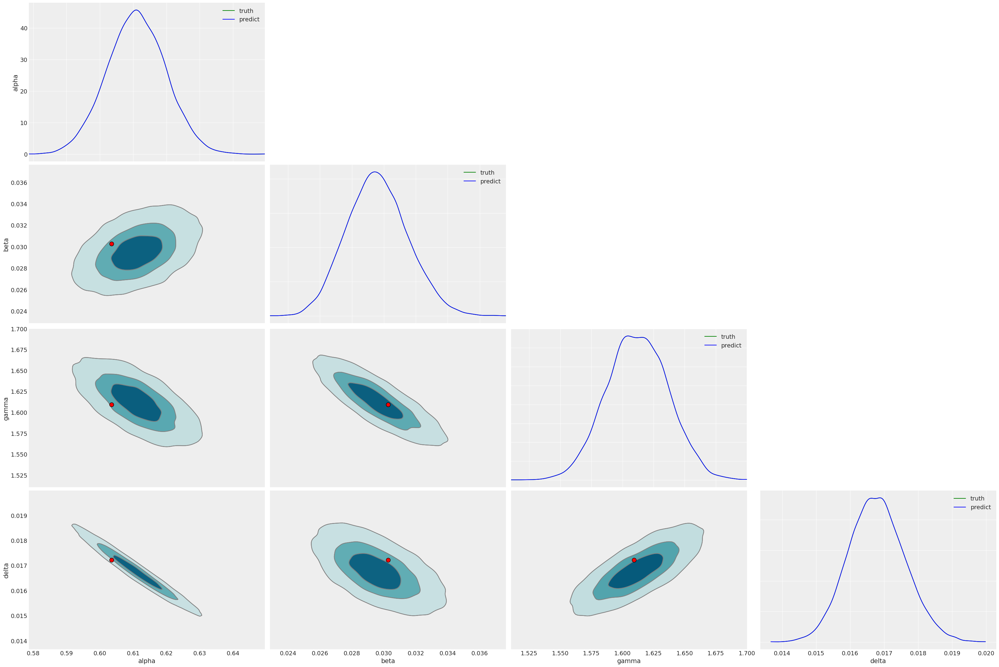

<Figure size 1000x1000 with 0 Axes>

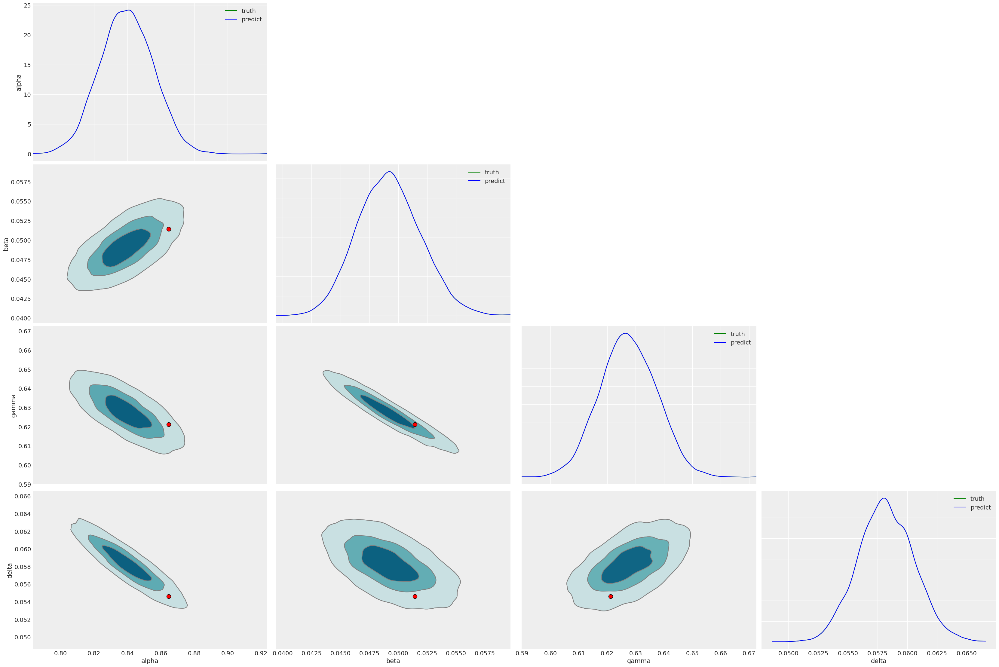

<Figure size 1000x1000 with 0 Axes>

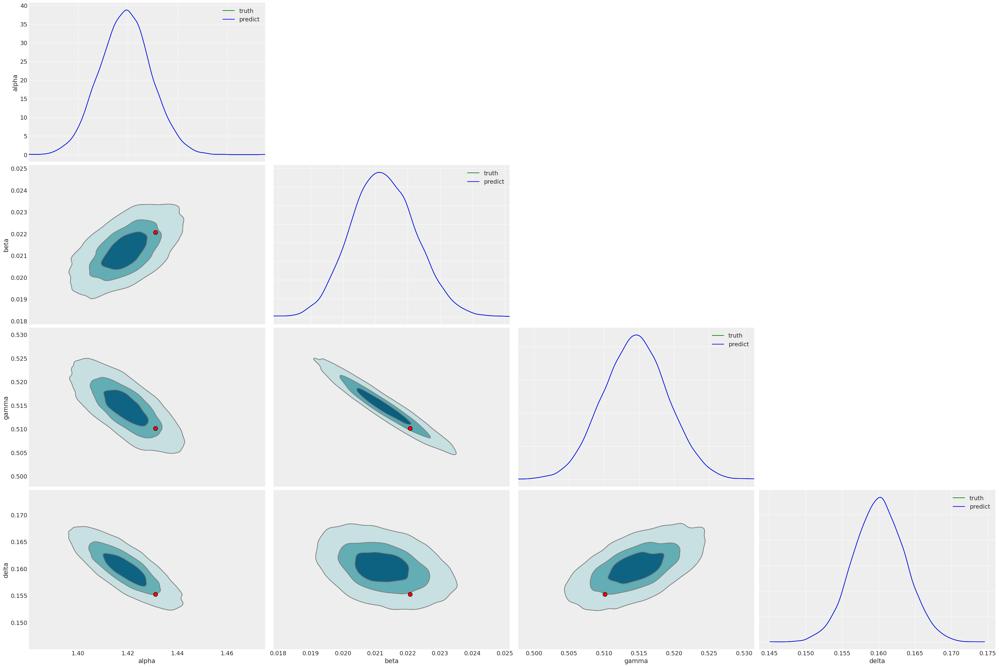

<Figure size 1000x1000 with 0 Axes>

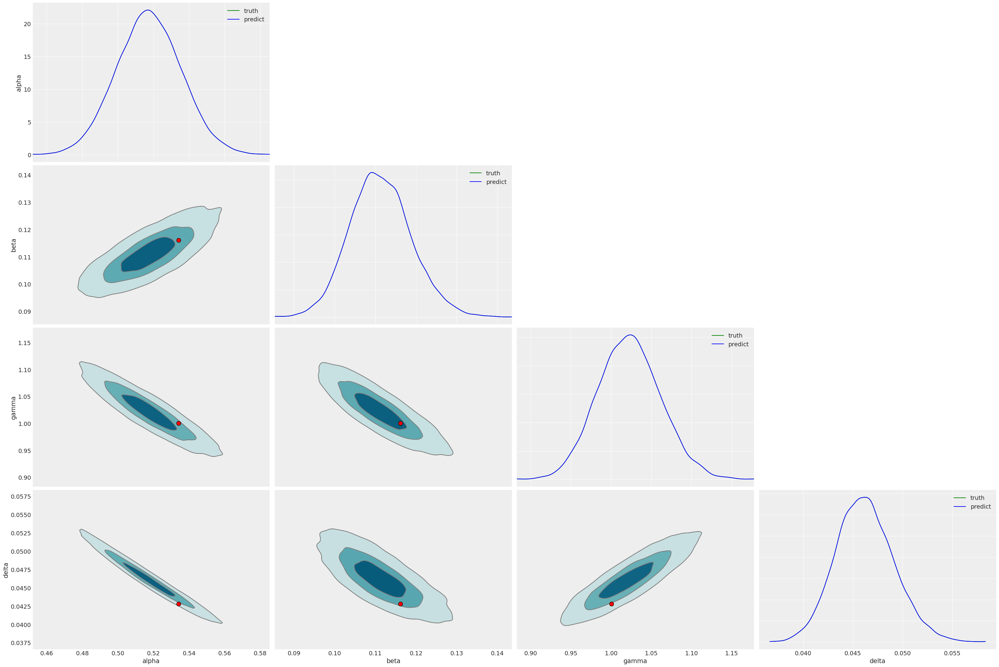

<Figure size 1000x1000 with 0 Axes>

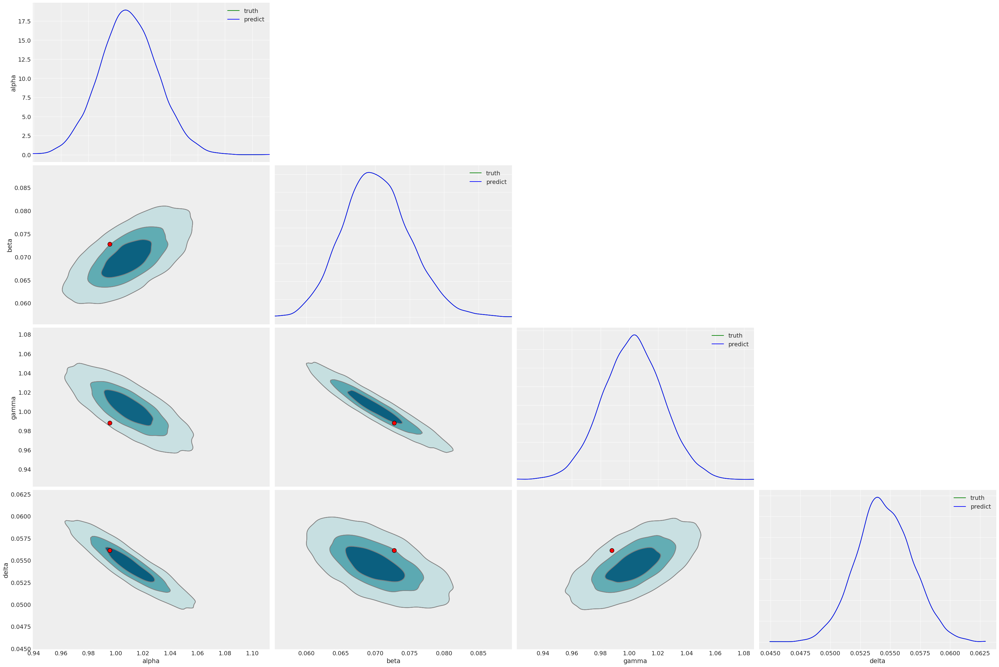

In [11]:
# without latent variables and wide prior 
for i in range(5):

  truth, observation = get_batch1(jax.random.PRNGKey(i))

  mcmc = MCMC(
      NUTS(model1, dense_mass=True,
          init_strategy=initialization.init_to_sample),
      num_warmup=1000,
      num_samples=10000,
      num_chains=1,
      progress_bar=True,
  )
  mcmc.run(PRNGKey(188), y=observation.squeeze()) 
  mcmc.print_summary()
  print(truth)

  test_samples = mcmc.get_samples()
  jnp.save('reference_sample_without_latent_variables_seed%d' % i, test_samples['theta'])

  import arviz as az
  az.style.use("arviz-darkgrid")

  parameters = ["alpha", "beta", "gamma", "delta"]

  reference_samples = test_samples['theta']
  

  plt.figure(figsize=(10, 10))
  ax = az.plot_pair(
        data={
          k: reference_samples[:,i]
          for i,k in enumerate(parameters)
        },
        kind="kde",
        var_names=parameters,
        kde_kwargs={
            "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
            "contourf_kwargs": {"cmap": "Greens"},
        },
        marginals=True,
        marginal_kwargs={'color': 'g', 'label': 'truth'},
        reference_values=dict(zip(parameters, np.array(truth.squeeze()))),
        reference_values_kwargs={'markersize': 10, 'color': 'red', 'label': 'truth'}

    )
  
  az.plot_pair(
      data={
        k: prior1[:,i] 
        for i,k in enumerate(parameters)
      },
      kind="kde",
      var_names=parameters,
      kde_kwargs={
          "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
          "contourf_kwargs": {"cmap": "Blues", "alpha": 0.7},
      },
      marginals=True,
      marginal_kwargs={'color': 'b', 'label': 'predict'}, 
      ax=ax
  )

  


sample: 100%|██████████| 11000/11000 [00:22<00:00, 483.38it/s, 7 steps of size 7.02e-01. acc. prob=0.89]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.36      0.01      0.36      0.34      0.37  13317.66      1.00
  theta[1]      0.03      0.00      0.03      0.03      0.03  12669.06      1.00
  theta[2]      0.57      0.02      0.57      0.54      0.60  12346.03      1.00
  theta[3]      0.04      0.00      0.04      0.03      0.04  12899.81      1.00
      z[0]      1.77      0.08      1.76      1.64      1.90  13604.62      1.00
      z[1]      4.38      0.29      4.37      3.91      4.84  12731.18      1.00

Number of divergences: 0
[[0.35702354 0.02939574 0.5667058  0.03391683]]


sample: 100%|██████████| 11000/11000 [00:28<00:00, 388.11it/s, 7 steps of size 5.21e-01. acc. prob=0.92]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.60      0.03      1.60      1.54      1.65  12278.37      1.00
  theta[1]      0.05      0.00      0.05      0.04      0.05  12564.54      1.00
  theta[2]      0.71      0.01      0.71      0.69      0.74  12756.48      1.00
  theta[3]      0.08      0.01      0.08      0.07      0.09  12377.73      1.00
      z[0]      1.56      0.08      1.56      1.43      1.69  14233.96      1.00
      z[1]      3.08      0.14      3.07      2.84      3.29  14027.95      1.00

Number of divergences: 0
[[1.613832   0.0502388  0.69613564 0.08058142]]


sample: 100%|██████████| 11000/11000 [00:23<00:00, 470.36it/s, 7 steps of size 5.70e-01. acc. prob=0.94]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.33      0.09      1.32      1.17      1.47  14634.38      1.00
  theta[1]      0.14      0.01      0.14      0.12      0.16  14512.55      1.00
  theta[2]      0.40      0.03      0.40      0.35      0.44  14912.81      1.00
  theta[3]      0.03      0.00      0.03      0.02      0.03  15510.08      1.00
      z[0]      4.88      0.27      4.87      4.43      5.32  16110.75      1.00
      z[1]      6.19      0.28      6.19      5.75      6.65  17272.27      1.00

Number of divergences: 0
[[1.320041   0.13699152 0.3995902  0.02453209]]


sample: 100%|██████████| 11000/11000 [00:27<00:00, 400.27it/s, 7 steps of size 6.28e-01. acc. prob=0.92]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.91      0.03      0.90      0.85      0.95  13219.16      1.00
  theta[1]      0.04      0.00      0.04      0.03      0.04  13480.11      1.00
  theta[2]      0.42      0.02      0.42      0.39      0.44  13240.82      1.00
  theta[3]      0.04      0.00      0.04      0.04      0.04  14424.79      1.00
      z[0]      3.08      0.15      3.07      2.82      3.32  15378.39      1.00
      z[1]      7.02      0.32      7.02      6.50      7.54  15145.58      1.00

Number of divergences: 0
[[0.855269   0.0363955  0.4325036  0.04338554]]


sample: 100%|██████████| 11000/11000 [00:25<00:00, 427.62it/s, 7 steps of size 6.44e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      1.01      0.04      1.01      0.95      1.08  12544.91      1.00
  theta[1]      0.06      0.00      0.06      0.06      0.07  12758.70      1.00
  theta[2]      0.93      0.03      0.93      0.87      0.98  11903.73      1.00
  theta[3]      0.06      0.00      0.06      0.06      0.07  11829.42      1.00
      z[0]      4.56      0.23      4.55      4.19      4.94  14036.03      1.00
      z[1]      4.37      0.21      4.36      4.04      4.70  12941.18      1.00

Number of divergences: 0
[[0.97523713 0.05759981 0.9763306  0.0683942 ]]


<Figure size 1000x1000 with 0 Axes>

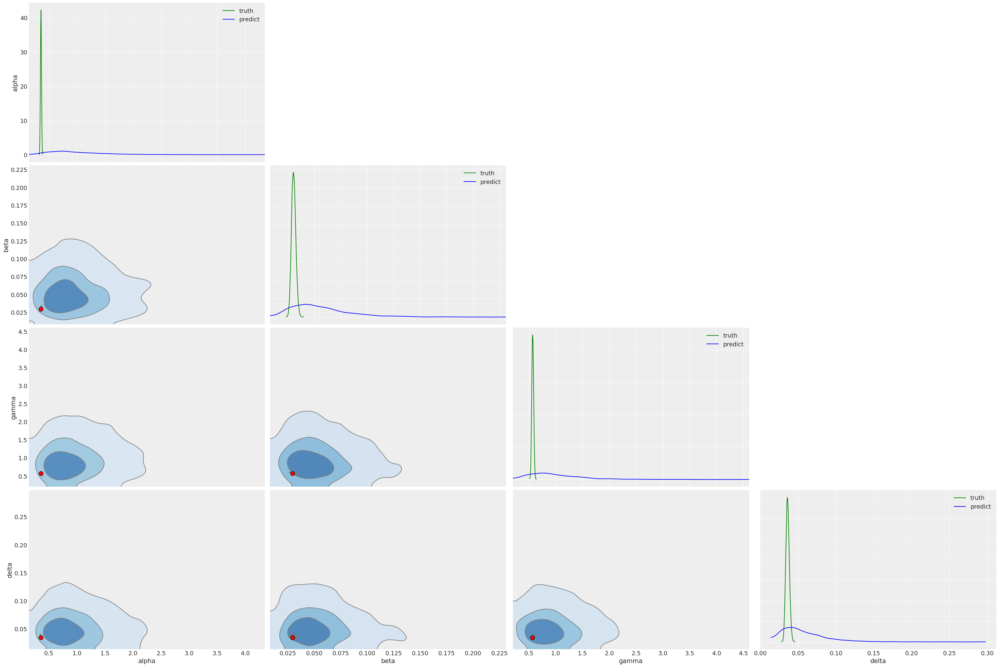

<Figure size 1000x1000 with 0 Axes>

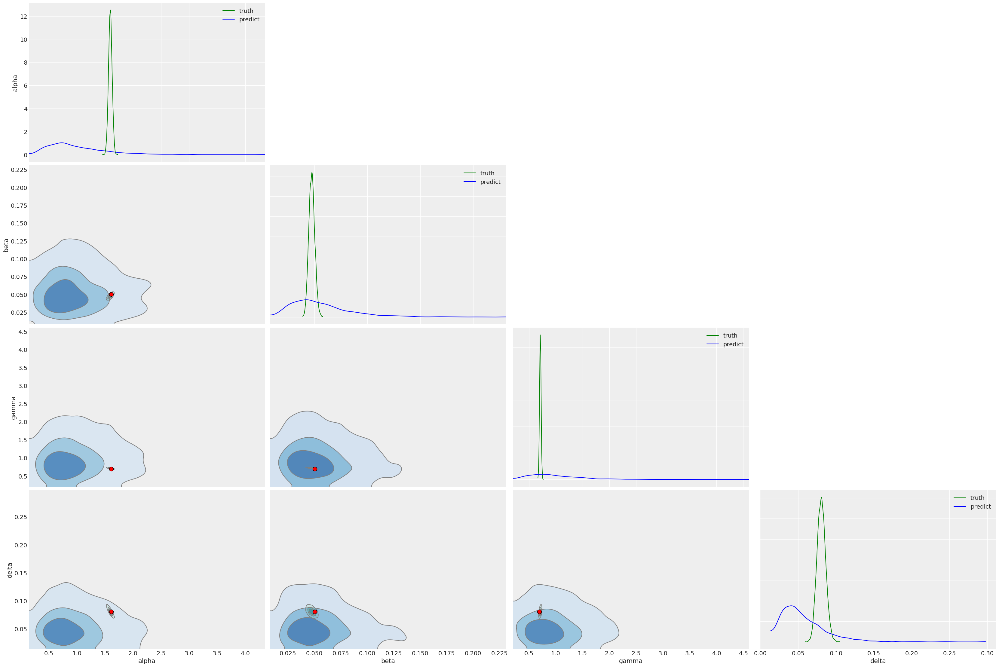

<Figure size 1000x1000 with 0 Axes>

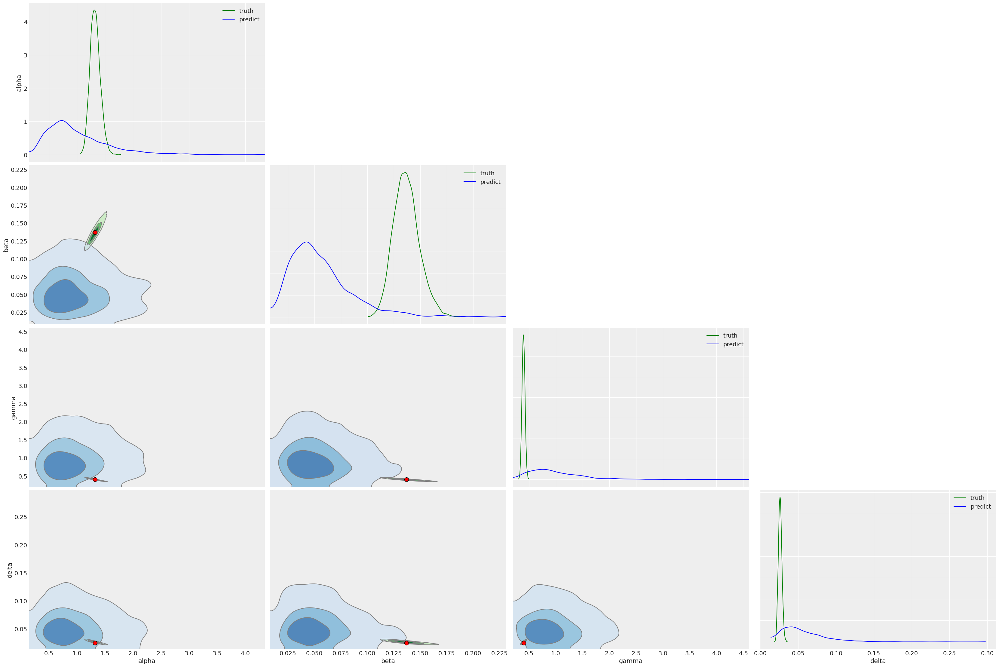

<Figure size 1000x1000 with 0 Axes>

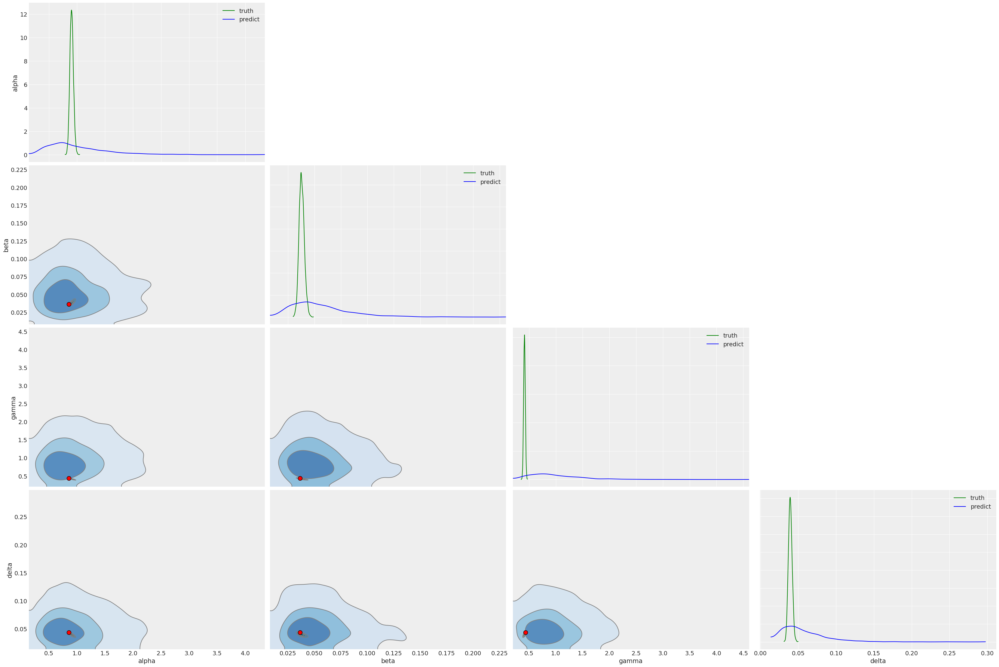

<Figure size 1000x1000 with 0 Axes>

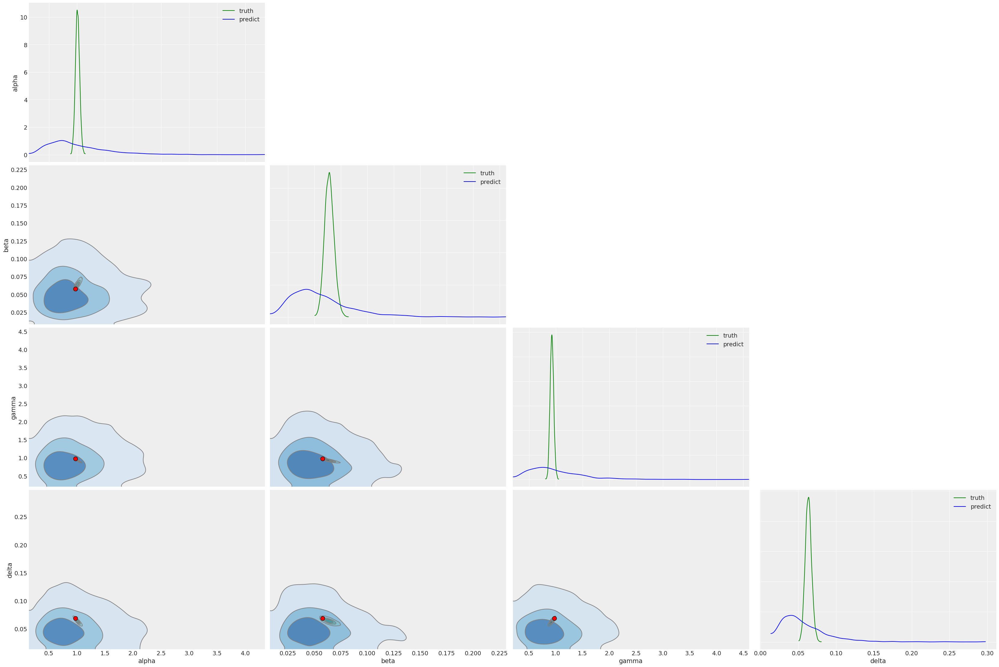

In [33]:
# with latent variables and wide prior
for i in range(5):

  truth, observation = get_batch2(jax.random.PRNGKey(i))

  mcmc = MCMC(
      NUTS(model2, dense_mass=True,
          init_strategy=initialization.init_to_sample),
      num_warmup=1000,
      num_samples=10000,
      num_chains=1,
      progress_bar=True,
  )
  mcmc.run(PRNGKey(188), y=observation.squeeze()) 
  mcmc.print_summary()
  print(truth)

  test_samples = mcmc.get_samples()
  jnp.save('reference_sample_seed%d.npy' %i, test_samples['theta'])

  import arviz as az
  az.style.use("arviz-darkgrid")

  parameters = ["alpha", "beta", "gamma", "delta"]

  reference_samples = test_samples['theta']

  plt.figure(figsize=(10, 10))
  ax = az.plot_pair(
        data={
          k: reference_samples[:,i]
          for i,k in enumerate(parameters)
        },
        kind="kde",
        var_names=parameters,
        kde_kwargs={
            "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
            "contourf_kwargs": {"cmap": "Greens"},
        },
        marginals=True,
        marginal_kwargs={'color': 'g', 'label': 'truth'},
        reference_values=dict(zip(parameters, np.array(truth.squeeze()))),
        reference_values_kwargs={'markersize': 10, 'color': 'red', 'label': 'truth'}

    )
  
  az.plot_pair(
      data={
        k: prior2[:,i] 
        for i,k in enumerate(parameters)
      },
      kind="kde",
      var_names=parameters,
      kde_kwargs={
          "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
          "contourf_kwargs": {"cmap": "Blues", "alpha": 0.7},
      },
      marginals=True,
      marginal_kwargs={'color': 'b', 'label': 'predict'}, 
      ax=ax
  )


sample: 100%|██████████| 11000/11000 [00:27<00:00, 398.54it/s, 7 steps of size 5.36e-01. acc. prob=0.93]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.85      0.01      0.85      0.83      0.87  13591.34      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05  14191.42      1.00
  theta[2]      0.87      0.01      0.87      0.85      0.89  15791.57      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05  13117.10      1.00
      z[0]      1.72      0.07      1.71      1.60      1.83  14510.52      1.00
      z[1]      4.56      0.19      4.56      4.26      4.89  13437.09      1.00

Number of divergences: 0
[[0.83585745 0.0482377  0.85935354 0.04865355]]


sample: 100%|██████████| 11000/11000 [00:27<00:00, 400.31it/s, 7 steps of size 5.90e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.91      0.01      0.91      0.89      0.93  13072.90      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05  13344.54      1.00
  theta[2]      0.87      0.01      0.87      0.85      0.89  14222.37      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05  12684.26      1.00
      z[0]      1.48      0.06      1.48      1.38      1.58  14225.73      1.00
      z[1]      3.37      0.14      3.36      3.13      3.58  14295.77      1.00

Number of divergences: 0
[[0.91504383 0.04981406 0.8700256  0.05124644]]


sample: 100%|██████████| 11000/11000 [00:25<00:00, 438.57it/s, 3 steps of size 6.71e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.88      0.01      0.88      0.86      0.91  13124.22      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05  14789.57      1.00
  theta[2]      0.87      0.01      0.87      0.85      0.90  13610.62      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05  13606.08      1.00
      z[0]      4.81      0.22      4.80      4.44      5.14  14873.80      1.00
      z[1]      6.04      0.29      6.04      5.55      6.50  13867.53      1.00

Number of divergences: 0
[[0.9040775  0.05290432 0.8415255  0.04771706]]


sample: 100%|██████████| 11000/11000 [00:25<00:00, 432.28it/s, 7 steps of size 6.03e-01. acc. prob=0.92]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.89      0.01      0.89      0.87      0.92  13727.43      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05  14450.55      1.00
  theta[2]      0.86      0.01      0.86      0.84      0.88  14361.04      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05  14487.50      1.00
      z[0]      3.07      0.13      3.07      2.86      3.28  13553.90      1.00
      z[1]      6.90      0.32      6.89      6.38      7.42  13125.13      1.00

Number of divergences: 0
[[0.88083905 0.04885988 0.84553146 0.04937764]]


sample: 100%|██████████| 11000/11000 [00:25<00:00, 429.22it/s, 7 steps of size 6.85e-01. acc. prob=0.90]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.88      0.01      0.88      0.86      0.90  12493.83      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05  13428.39      1.00
  theta[2]      0.89      0.01      0.89      0.87      0.92  13352.71      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05  14121.51      1.00
      z[0]      4.58      0.20      4.58      4.24      4.90  14552.43      1.00
      z[1]      4.23      0.20      4.23      3.90      4.56  13686.48      1.00

Number of divergences: 0
[[0.88780385 0.05022441 0.8878635  0.0507447 ]]


<Figure size 1000x1000 with 0 Axes>

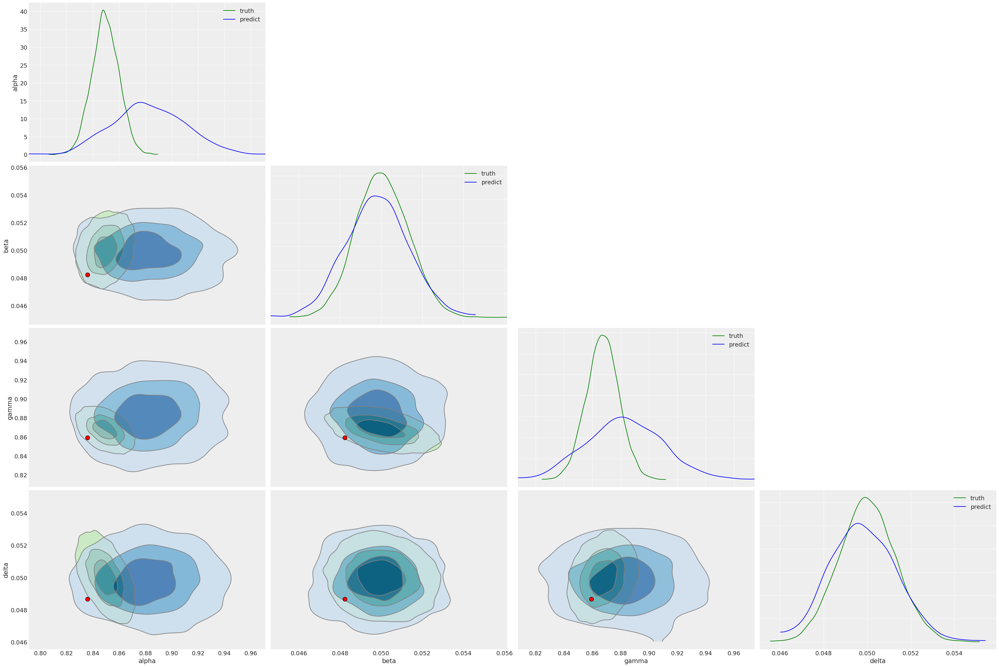

<Figure size 1000x1000 with 0 Axes>

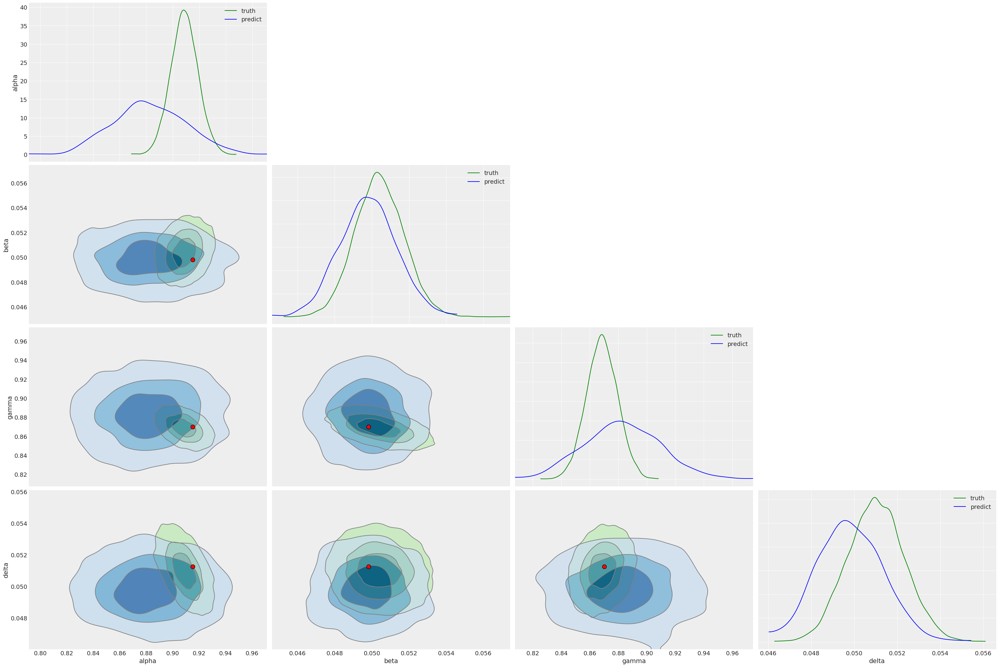

<Figure size 1000x1000 with 0 Axes>

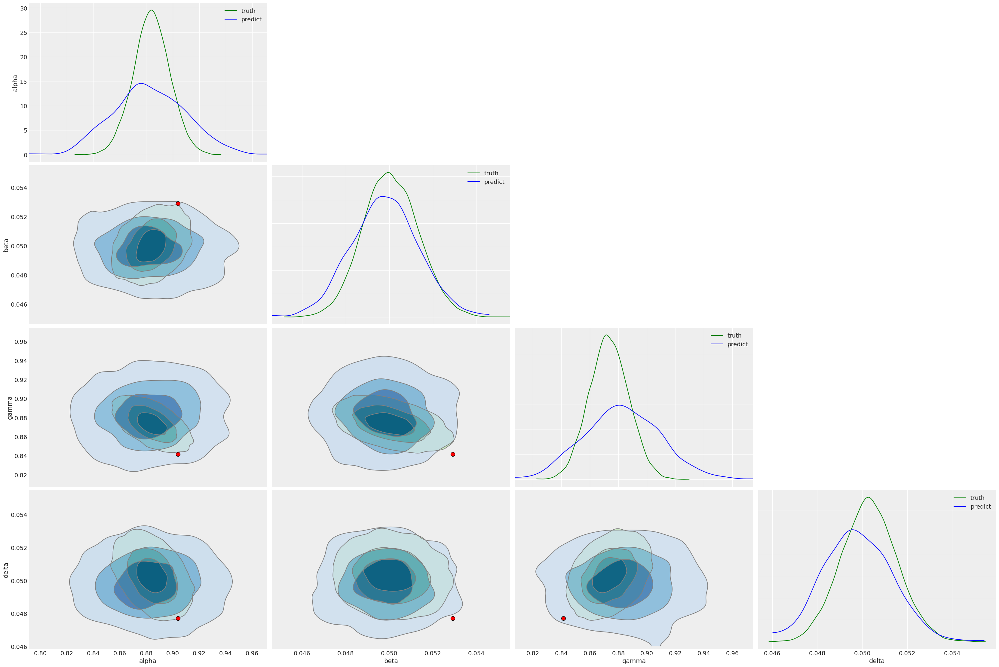

<Figure size 1000x1000 with 0 Axes>

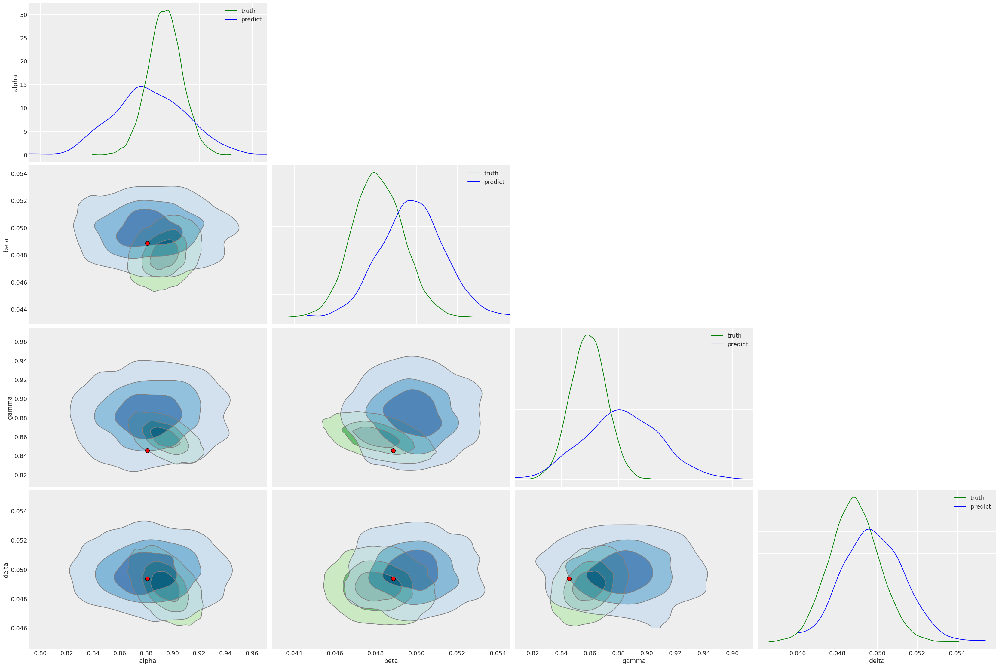

<Figure size 1000x1000 with 0 Axes>

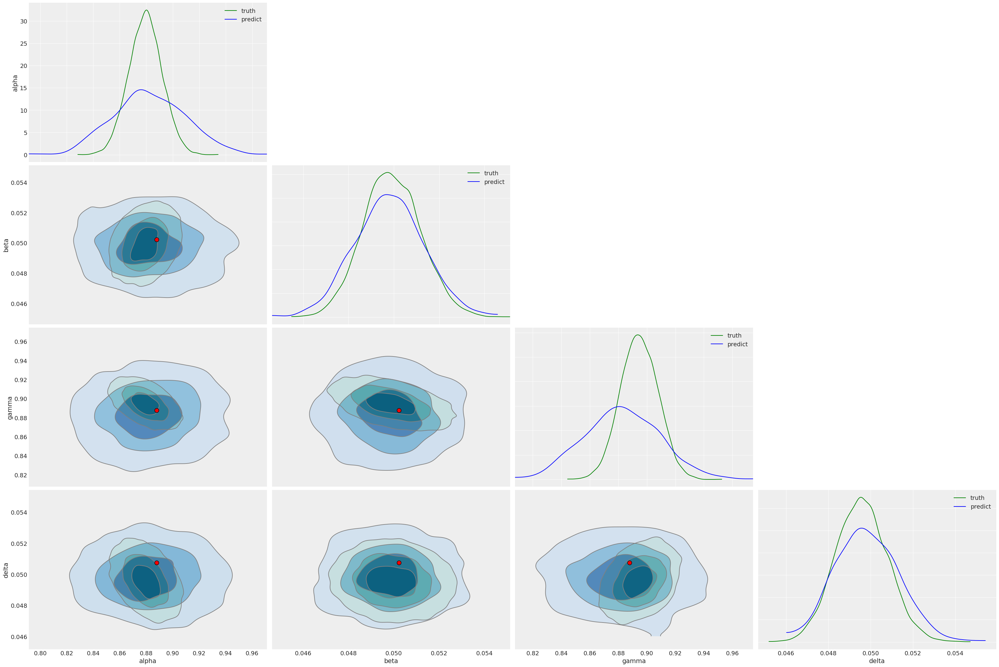

In [34]:
# with latent variables and tight prior
for i in range(5):

  truth, observation = get_batch3(jax.random.PRNGKey(i))

  mcmc = MCMC(
      NUTS(model3, dense_mass=True,
          init_strategy=initialization.init_to_sample),
      num_warmup=1000,
      num_samples=10000,
      num_chains=1,
      progress_bar=True,
  )
  mcmc.run(PRNGKey(188), y=observation.squeeze()) 
  mcmc.print_summary()
  print(truth)

  test_samples = mcmc.get_samples()
  jnp.save('reference_sample_tight_prior_seed%d.npy' %i, test_samples['theta'])

  import arviz as az
  az.style.use("arviz-darkgrid")

  parameters = ["alpha", "beta", "gamma", "delta"]

  reference_samples = test_samples['theta']

  plt.figure(figsize=(10, 10))
  ax = az.plot_pair(
        data={
          k: reference_samples[:,i]
          for i,k in enumerate(parameters)
        },
        kind="kde",
        var_names=parameters,
        kde_kwargs={
            "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
            "contourf_kwargs": {"cmap": "Greens"},
        },
        marginals=True,
        marginal_kwargs={'color': 'g', 'label': 'truth'},
        reference_values=dict(zip(parameters, np.array(truth.squeeze()))),
        reference_values_kwargs={'markersize': 10, 'color': 'red', 'label': 'truth'}

    )
  
  az.plot_pair(
      data={
        k: prior3[:,i] 
        for i,k in enumerate(parameters)
      },
      kind="kde",
      var_names=parameters,
      kde_kwargs={
          "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
          "contourf_kwargs": {"cmap": "Blues", "alpha": 0.7},
      },
      marginals=True,
      marginal_kwargs={'color': 'b', 'label': 'predict'}, 
      ax=ax
  )


sample: 100%|██████████| 11000/11000 [00:23<00:00, 474.37it/s, 3 steps of size 7.28e-01. acc. prob=0.89]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.84      0.01      0.84      0.82      0.86   9584.85      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05   8955.20      1.00
  theta[2]      0.92      0.01      0.92      0.90      0.93   8430.71      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05   8904.52      1.00

Number of divergences: 0
[[0.8626034  0.04832247 0.91488963 0.04671461]]


sample: 100%|██████████| 11000/11000 [00:23<00:00, 474.50it/s, 3 steps of size 6.70e-01. acc. prob=0.91]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.88      0.01      0.88      0.86      0.89   9449.13      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05   9330.71      1.00
  theta[2]      0.86      0.01      0.86      0.85      0.88   9234.34      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05   9348.05      1.00

Number of divergences: 0
[[0.88141245 0.04988406 0.8641021  0.05006469]]


sample: 100%|██████████| 11000/11000 [00:22<00:00, 482.51it/s, 3 steps of size 7.56e-01. acc. prob=0.88]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.91      0.01      0.91      0.89      0.92   9583.49      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05   7758.50      1.00
  theta[2]      0.86      0.01      0.86      0.85      0.87   7918.60      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05   8382.79      1.00

Number of divergences: 0
[[0.9084696  0.04741533 0.8539485  0.05330278]]


sample: 100%|██████████| 11000/11000 [00:22<00:00, 494.35it/s, 3 steps of size 7.13e-01. acc. prob=0.90]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.85      0.01      0.85      0.84      0.87   9414.59      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05   9593.54      1.00
  theta[2]      0.89      0.01      0.89      0.88      0.91   9209.89      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05   8902.38      1.00

Number of divergences: 0
[[0.8563015  0.05238293 0.88915366 0.04933677]]


sample: 100%|██████████| 11000/11000 [00:25<00:00, 434.01it/s, 3 steps of size 7.34e-01. acc. prob=0.89]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
  theta[0]      0.88      0.01      0.88      0.87      0.90   9814.98      1.00
  theta[1]      0.05      0.00      0.05      0.05      0.05   8065.97      1.00
  theta[2]      0.90      0.01      0.90      0.89      0.91   8313.64      1.00
  theta[3]      0.05      0.00      0.05      0.05      0.05   9803.95      1.00

Number of divergences: 0
[[0.8889062  0.0509332  0.8884906  0.05014597]]


<Figure size 1000x1000 with 0 Axes>

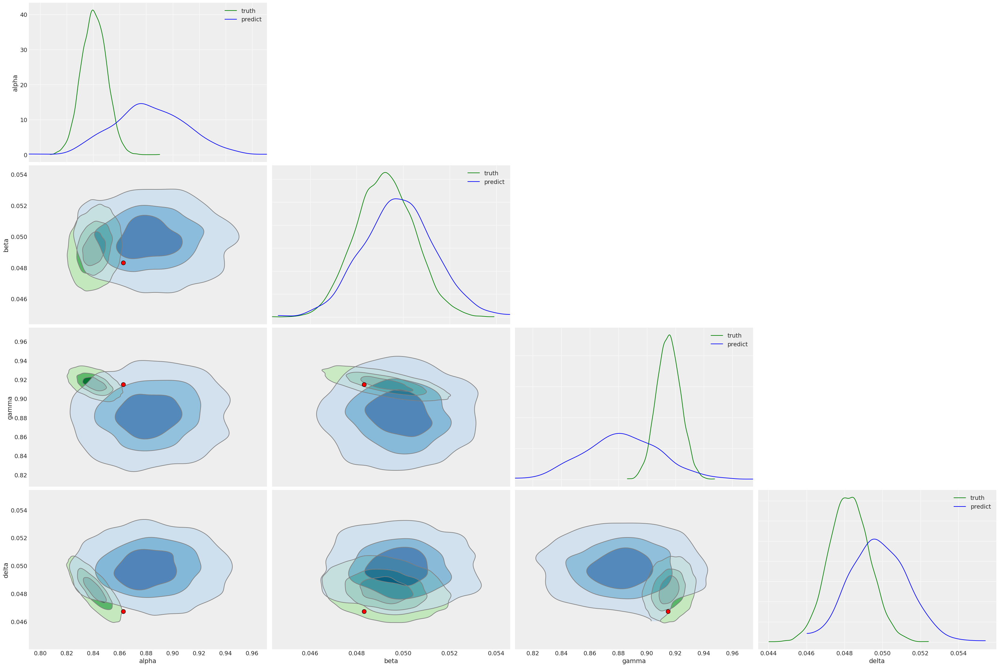

<Figure size 1000x1000 with 0 Axes>

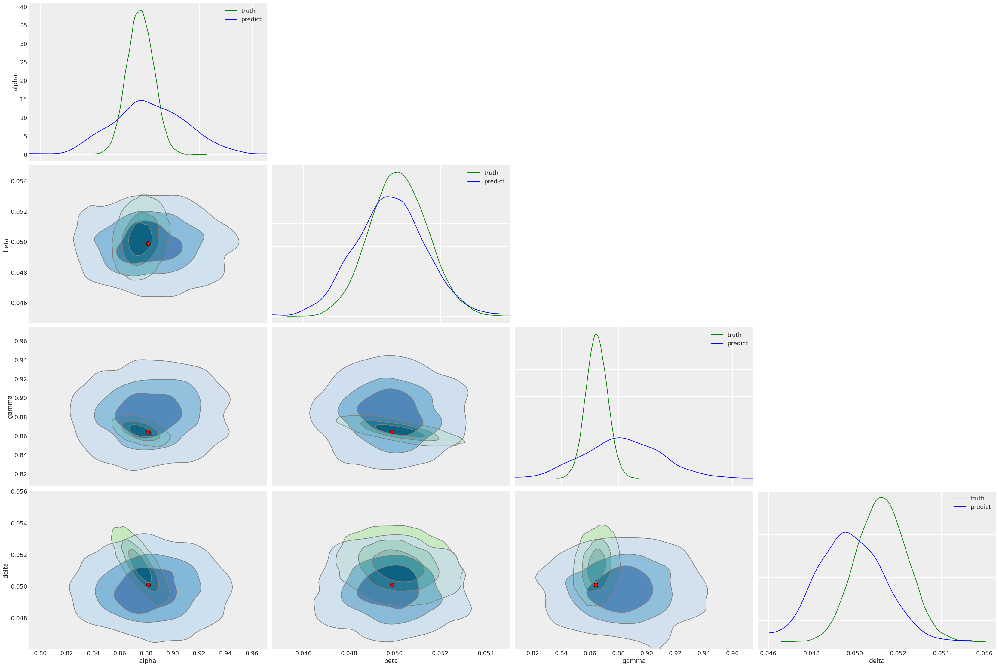

<Figure size 1000x1000 with 0 Axes>

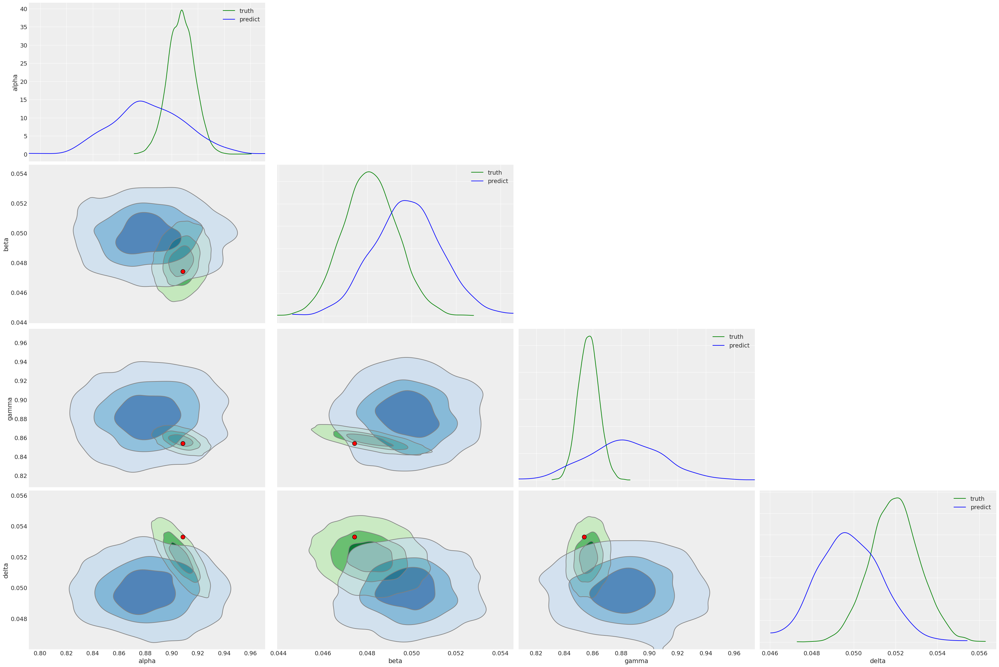

<Figure size 1000x1000 with 0 Axes>

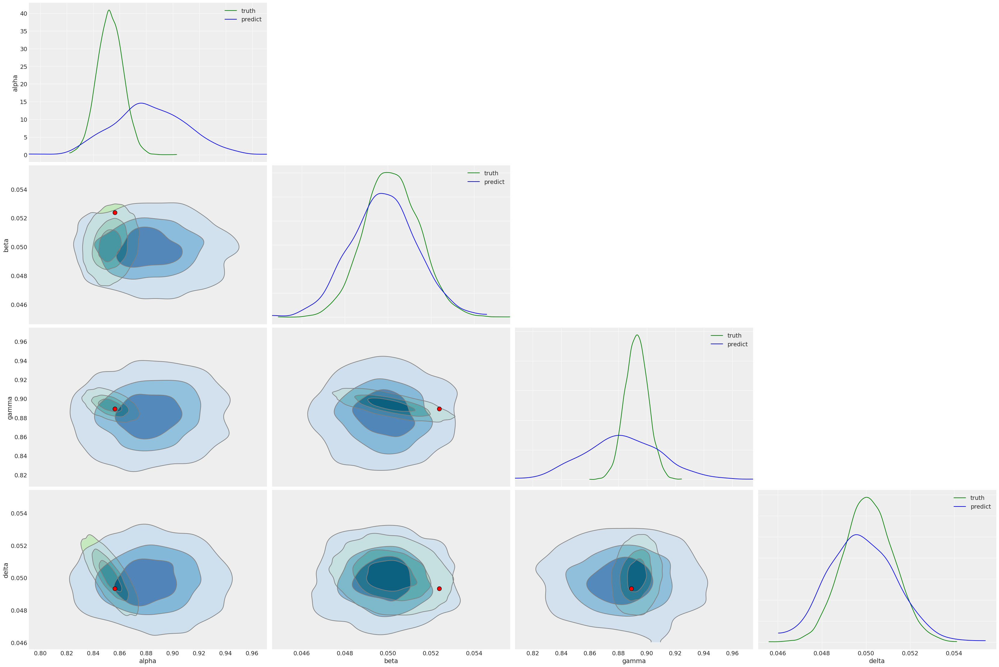

<Figure size 1000x1000 with 0 Axes>

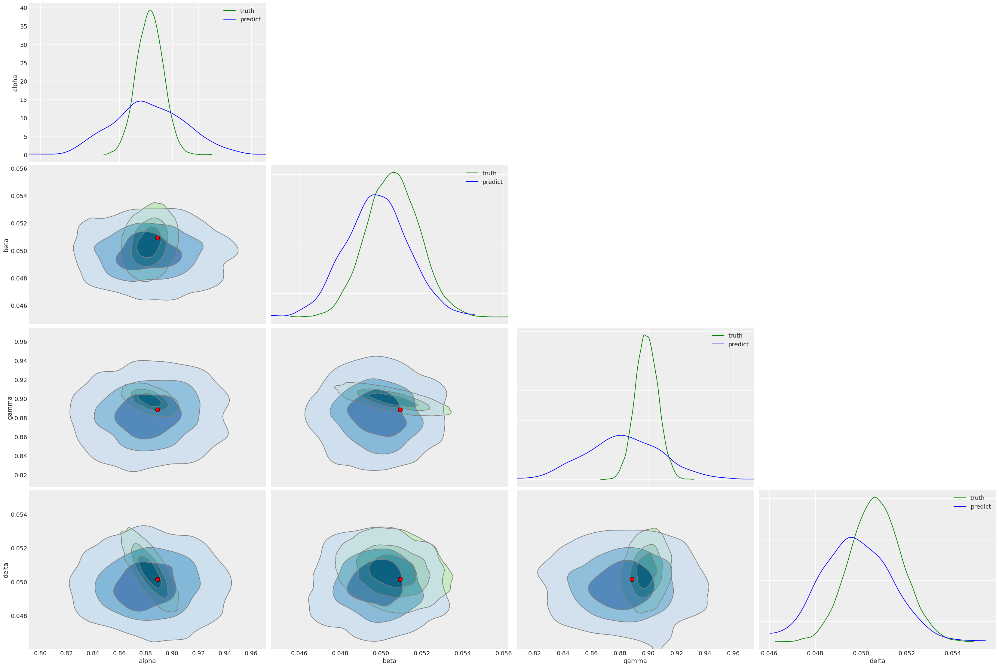

In [30]:
# without latent variables and tight prior
for i in range(5):

  truth, observation = get_batch4(jax.random.PRNGKey(i))

  mcmc = MCMC(
      NUTS(model4, dense_mass=True,
          init_strategy=initialization.init_to_sample),
      num_warmup=1000,
      num_samples=10000,
      num_chains=1,
      progress_bar=True,
  )
  mcmc.run(PRNGKey(188), y=observation.squeeze()) 
  mcmc.print_summary()
  print(truth)

  test_samples = mcmc.get_samples()
  jnp.save('reference_sample_without_latent_variables_tight_prior_seed%d' % i, test_samples['theta'])

  import arviz as az
  az.style.use("arviz-darkgrid")

  parameters = ["alpha", "beta", "gamma", "delta"]

  reference_samples = test_samples['theta']

  plt.figure(figsize=(10, 10))
  ax = az.plot_pair(
        data={
          k: reference_samples[:,i]
          for i,k in enumerate(parameters)
        },
        kind="kde",
        var_names=parameters,
        kde_kwargs={
            "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
            "contourf_kwargs": {"cmap": "Greens"},
        },
        marginals=True,
        marginal_kwargs={'color': 'g', 'label': 'truth'},
        reference_values=dict(zip(parameters, np.array(truth.squeeze()))),
        reference_values_kwargs={'markersize': 10, 'color': 'red', 'label': 'truth'}

    )
  
  az.plot_pair(
      data={
        k: prior4[:,i] 
        for i,k in enumerate(parameters)
      },
      kind="kde",
      var_names=parameters,
      kde_kwargs={
          "hdi_probs": [0.3,0.6,0.9],  # Plot 30%, 60% and 90% HDI contours
          "contourf_kwargs": {"cmap": "Blues", "alpha": 0.7},
      },
      marginals=True,
      marginal_kwargs={'color': 'b', 'label': 'predict'}, 
      ax=ax
  )
